# Image fitting

After implementing all requested source code, you will fit an MLP and a SIREN to the same image.

These models train fairly fast on a CPU (~2 minutes on a M1 MacBook Pro), but feel free to train on a GPU or Colab for faster prototyping!

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.pyplot as plt
import torch

from problem_1_train import train
from utils import ImageDataset

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Experiment 1: MLPs vs SIRENs

First, fit the MLP.

Step 0 : loss=0.343288, psnr=4.643412


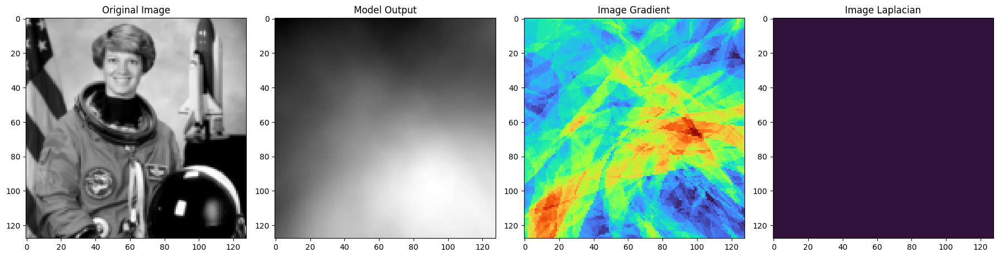

Step 100 : loss=0.230747, psnr=6.368632


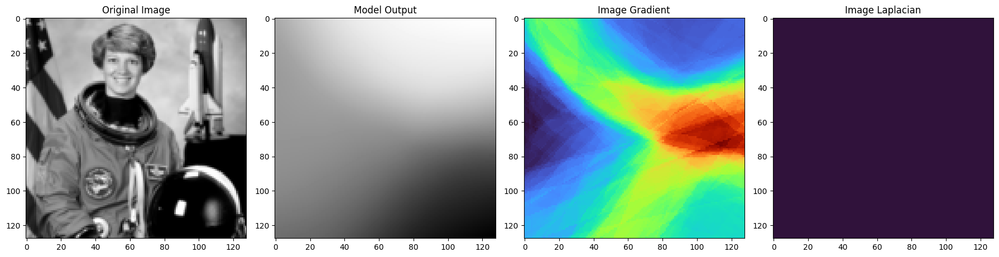

Step 200 : loss=0.204169, psnr=6.900103


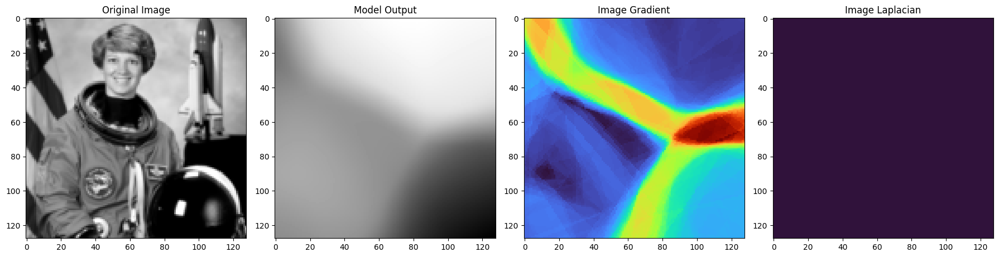

Step 300 : loss=0.182821, psnr=7.379749


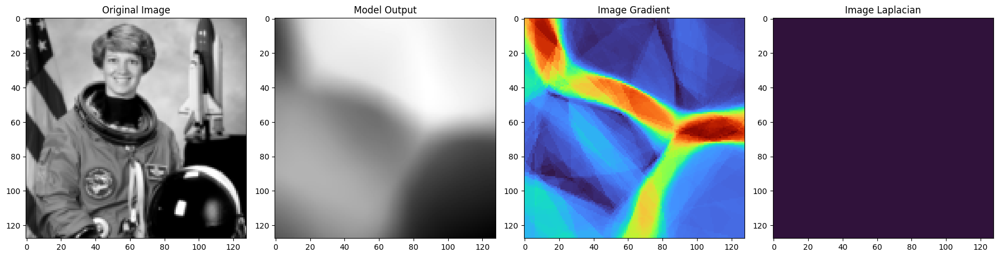

Step 400 : loss=0.160390, psnr=7.948216


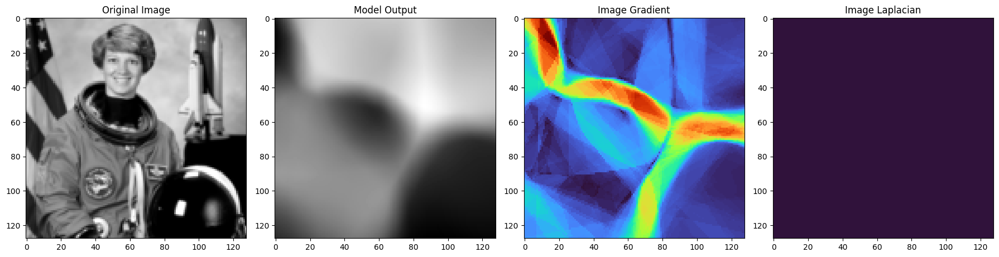

Step 500 : loss=0.140575, psnr=8.520926


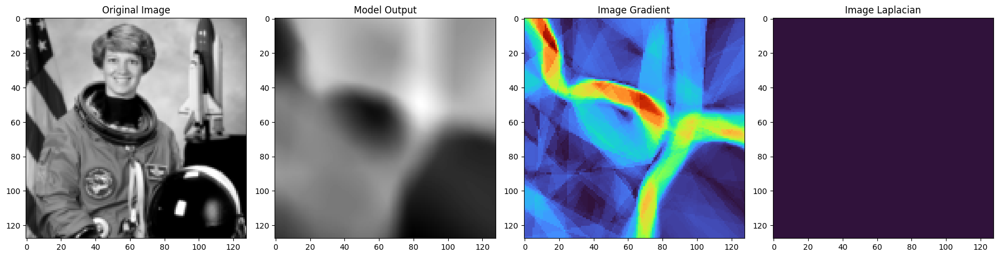

Step 600 : loss=0.126541, psnr=8.977695


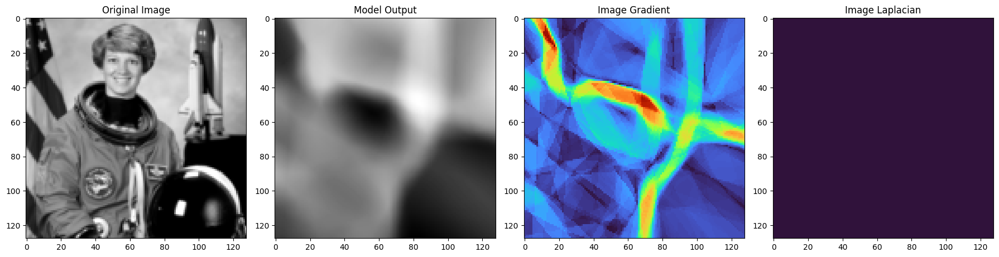

Step 700 : loss=0.115601, psnr=9.370395


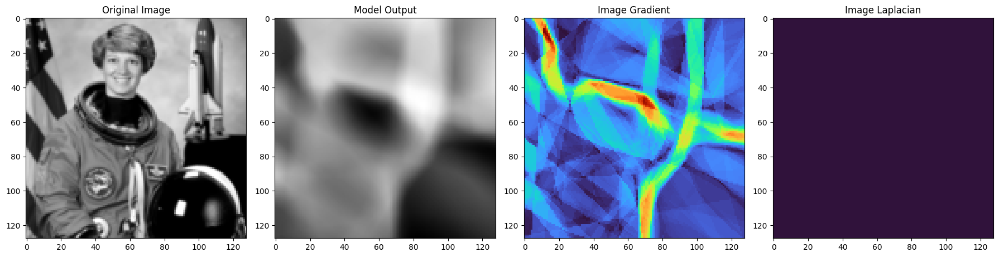

Step 800 : loss=0.106867, psnr=9.711568


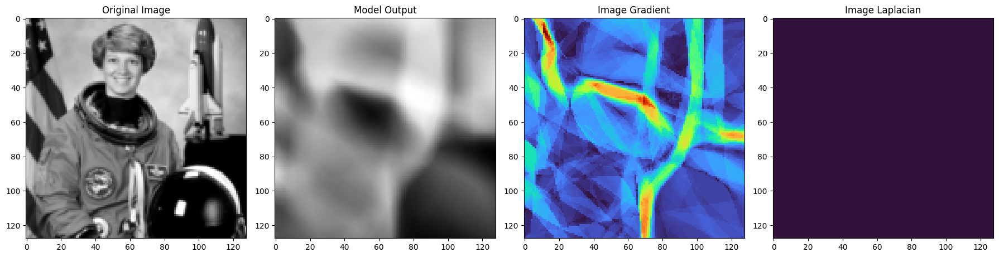

Step 900 : loss=0.099521, psnr=10.020872


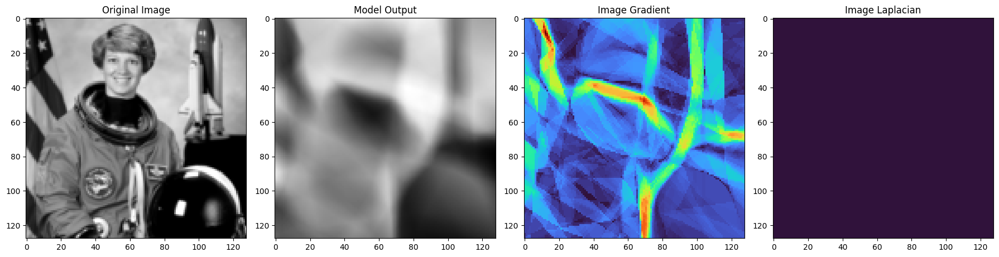

Step 1000 : loss=0.093679, psnr=10.283594


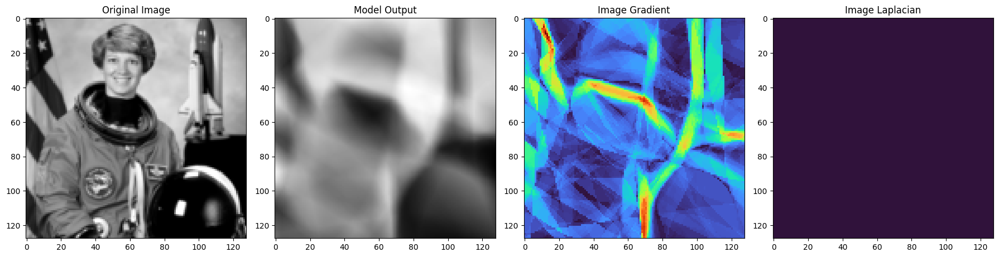

Step 1100 : loss=0.088328, psnr=10.539038


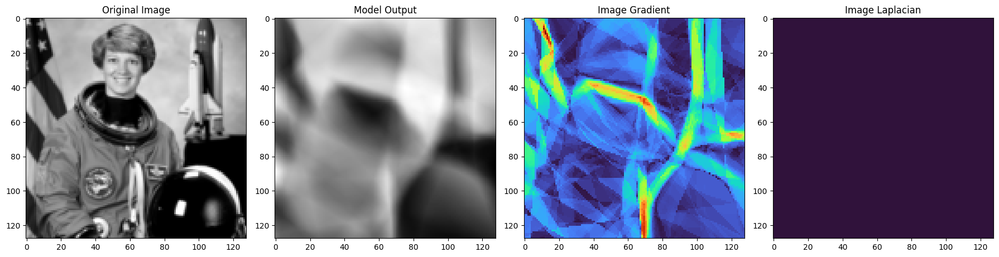

Step 1200 : loss=0.083903, psnr=10.762248


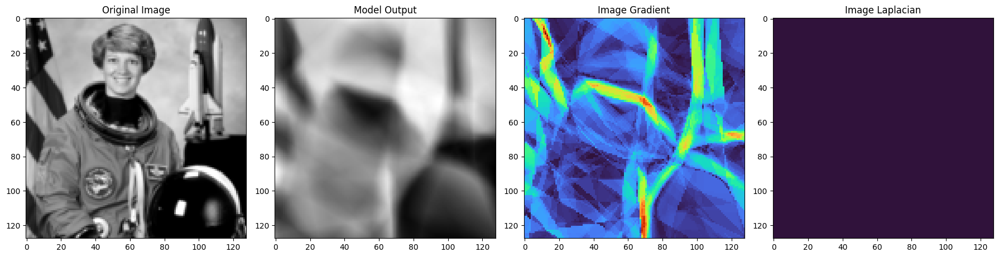

Step 1300 : loss=0.079464, psnr=10.998317


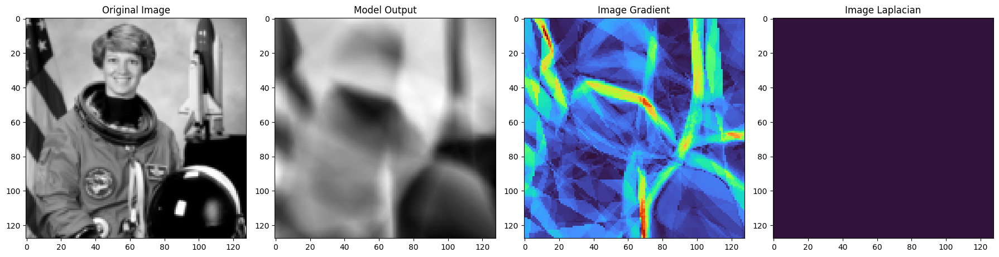

Step 1400 : loss=0.075783, psnr=11.204269


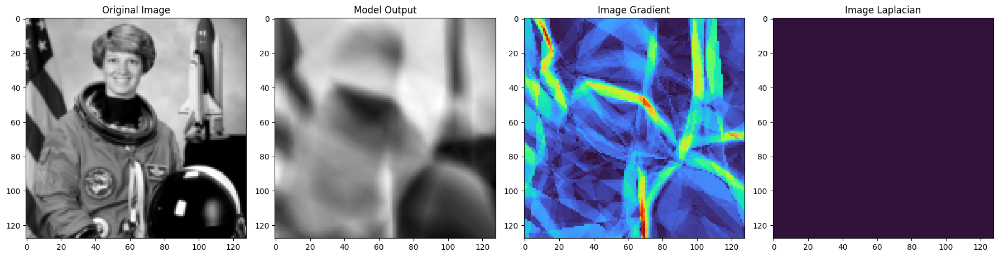

Step 1500 : loss=0.072469, psnr=11.398478


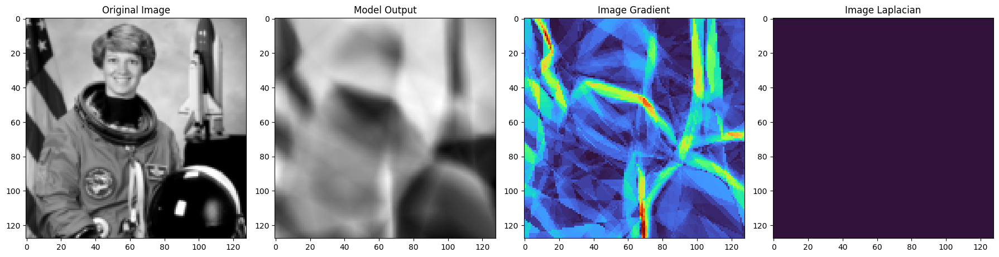

Step 1600 : loss=0.069419, psnr=11.585245


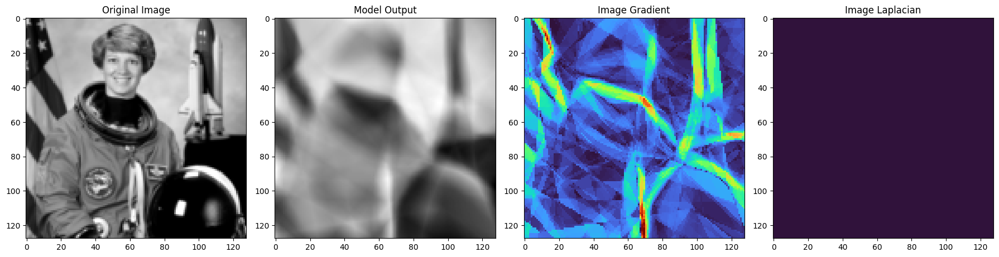

Step 1700 : loss=0.066824, psnr=11.750675


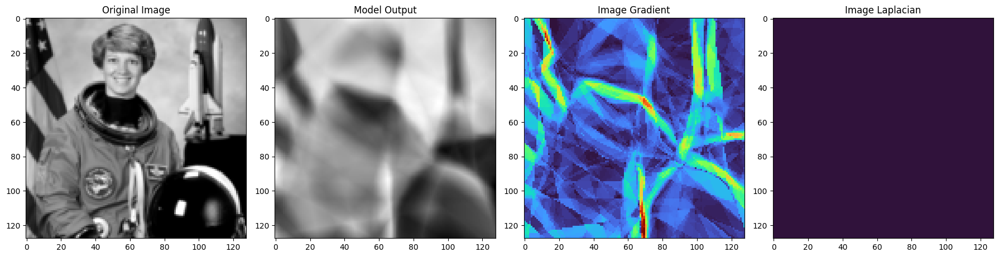

Step 1800 : loss=0.064405, psnr=11.910837


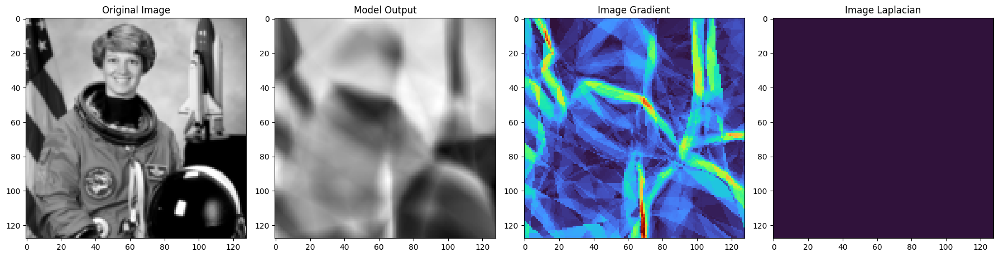

Step 1900 : loss=0.062304, psnr=12.054845


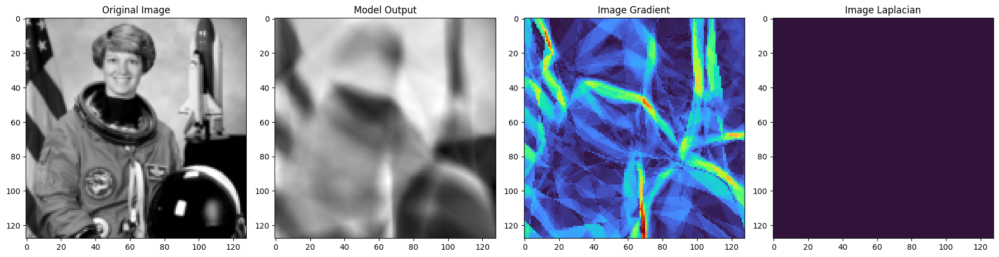

In [4]:
dataset = ImageDataset(height=128)

mlp_loss, mlp_psnr = train(
    model="MLP",
    dataset=dataset,
    lr=1e-4,
    total_steps=2000,
    steps_til_summary=100,
    device=device,
    seed = 42,
    **dict(
        in_features=2,
        out_features=1,
        hidden_features=128,
        hidden_layers=3,
        activation="ReLU",
    ),
)

Now fit the SIREN.

Step 24 : loss=0.065789, psnr=11.818457


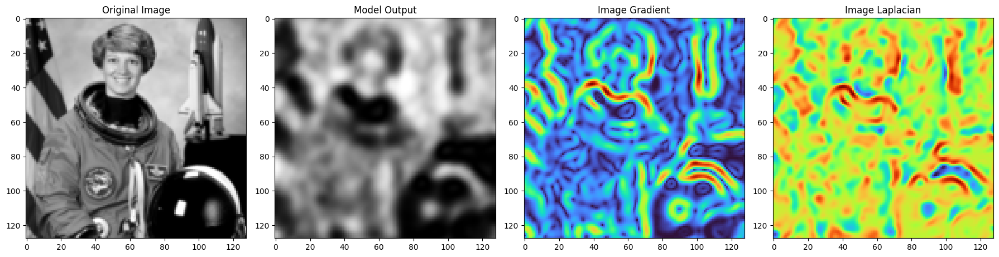

Step 49 : loss=0.038134, psnr=14.186827


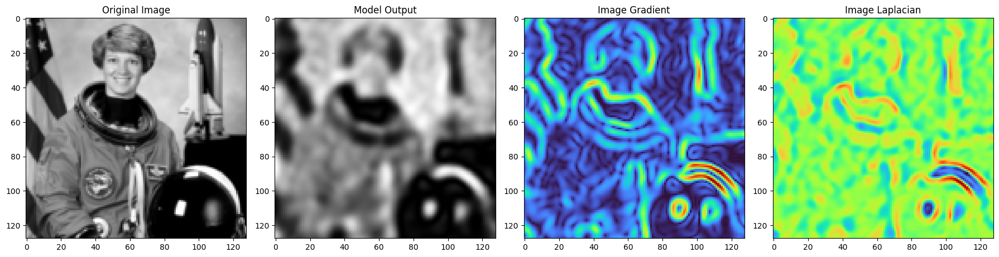

Step 74 : loss=0.030689, psnr=15.130165


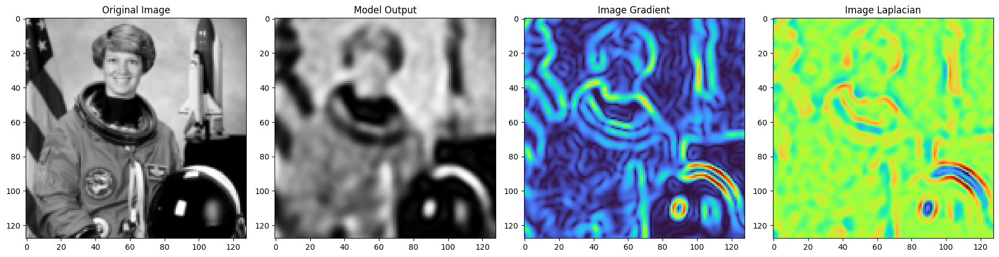

Step 99 : loss=0.027181, psnr=15.657307


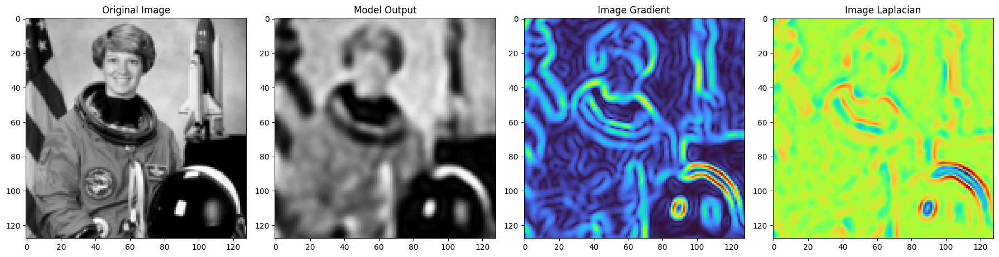

Step 124 : loss=0.024791, psnr=16.057013


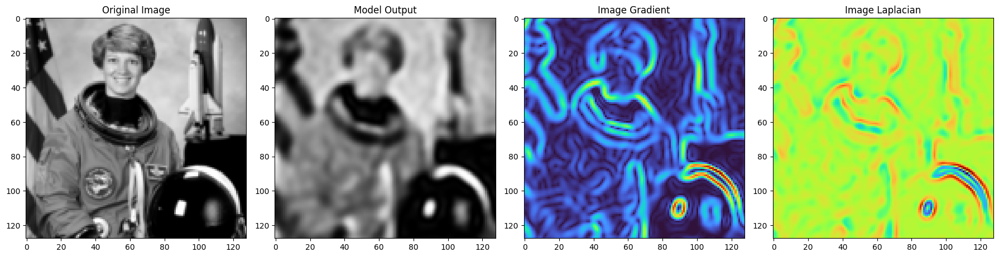

Step 149 : loss=0.022935, psnr=16.395065


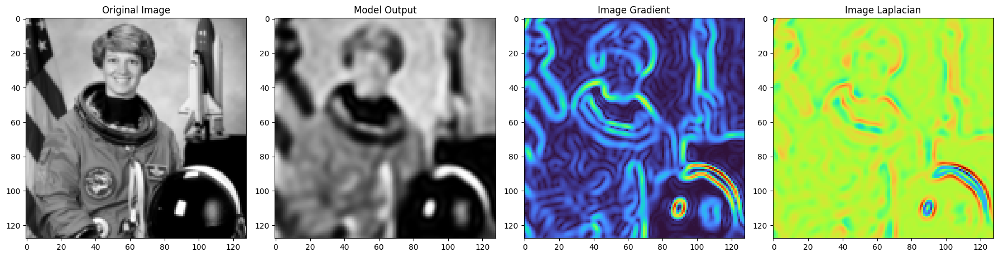

Step 174 : loss=0.021377, psnr=16.700500


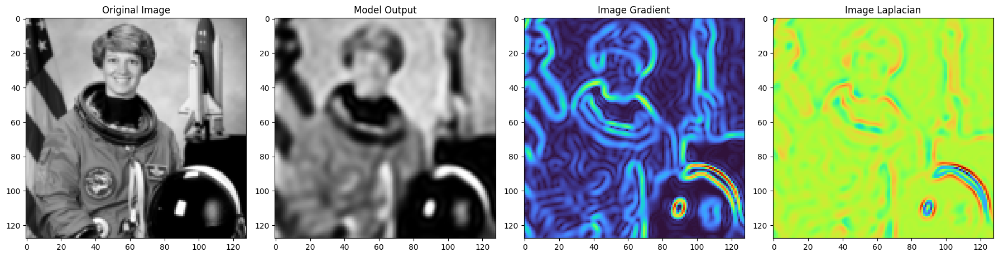

Step 199 : loss=0.020004, psnr=16.988758


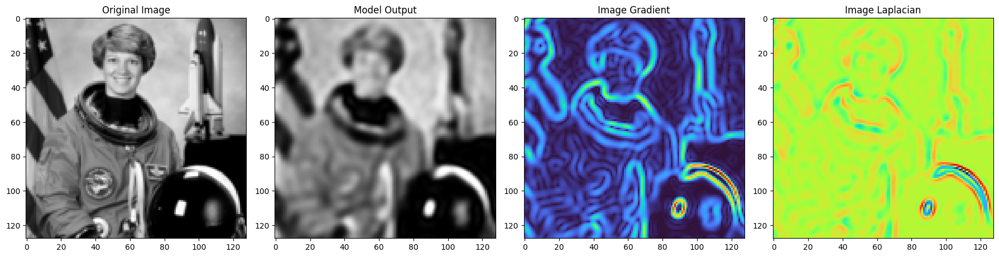

Step 224 : loss=0.018759, psnr=17.267941


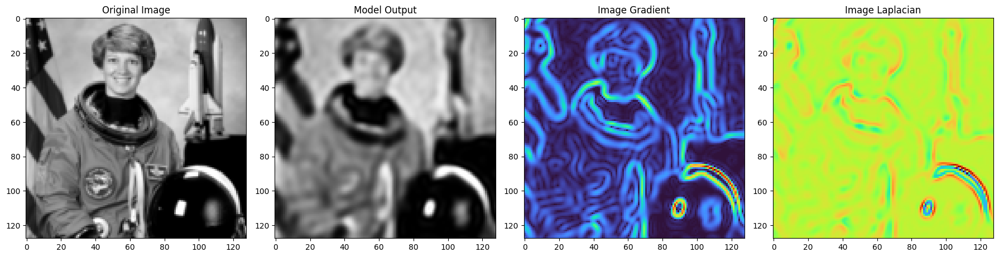

Step 249 : loss=0.017619, psnr=17.540119


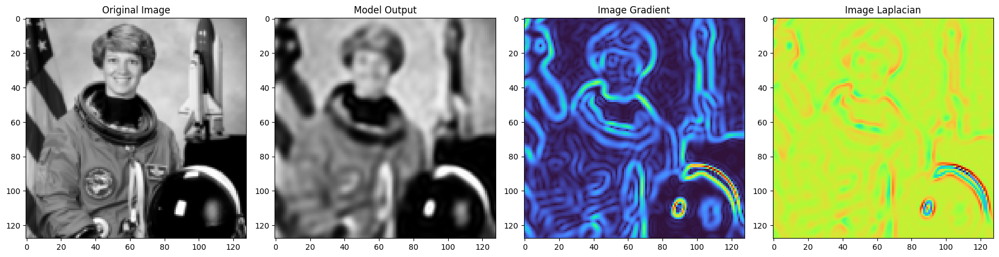

Step 274 : loss=0.016579, psnr=17.804392


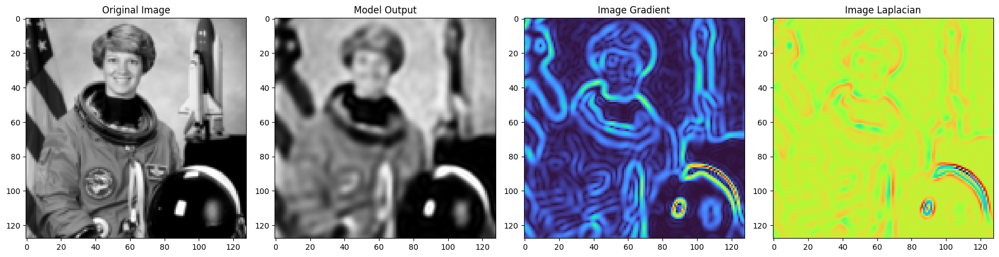

Step 299 : loss=0.015623, psnr=18.062298


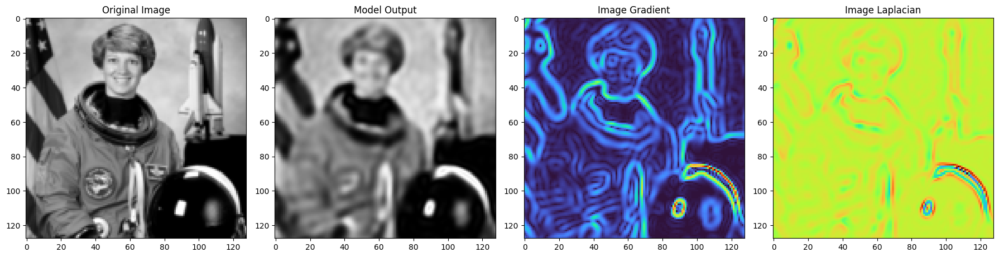

Step 324 : loss=0.014741, psnr=18.314825


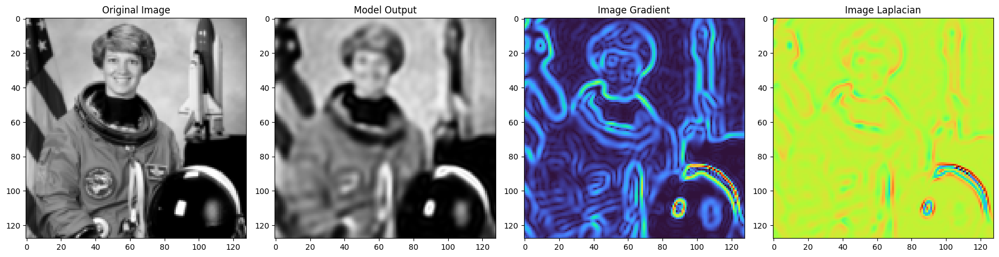

Step 349 : loss=0.013934, psnr=18.559397


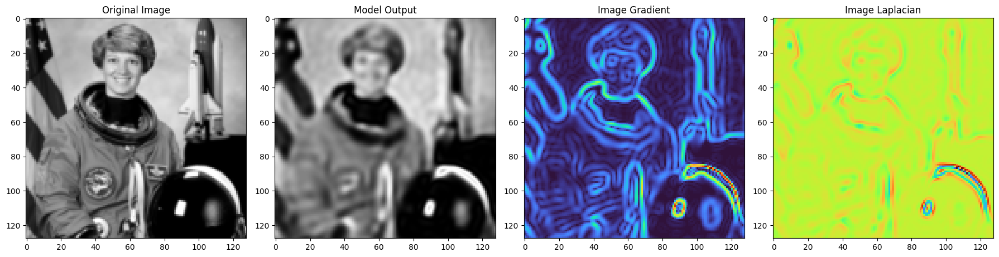

Step 374 : loss=0.013200, psnr=18.794395


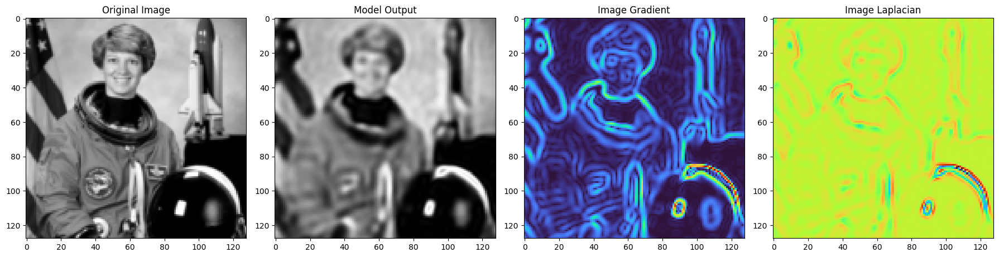

Step 399 : loss=0.012527, psnr=19.021433


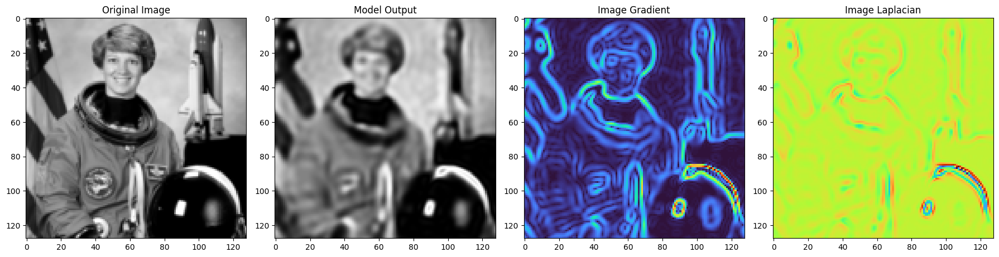

Step 424 : loss=0.011906, psnr=19.242397


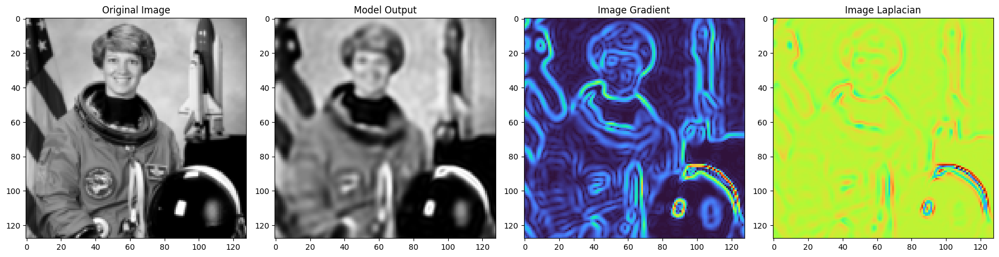

Step 449 : loss=0.011328, psnr=19.458380


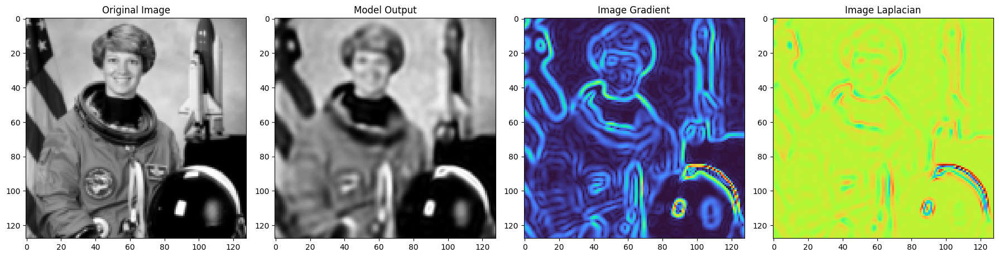

Step 474 : loss=0.010790, psnr=19.669823


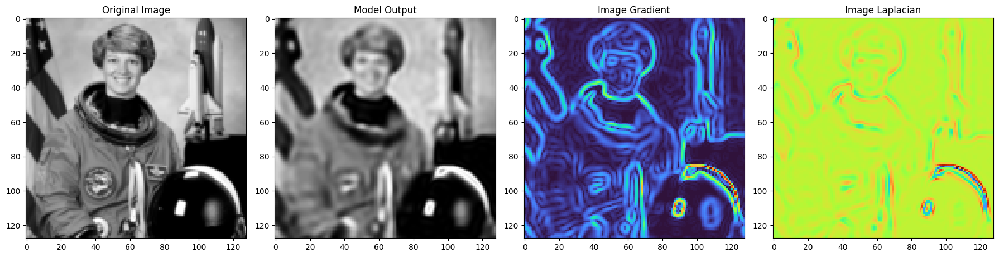

Step 499 : loss=0.010288, psnr=19.876646


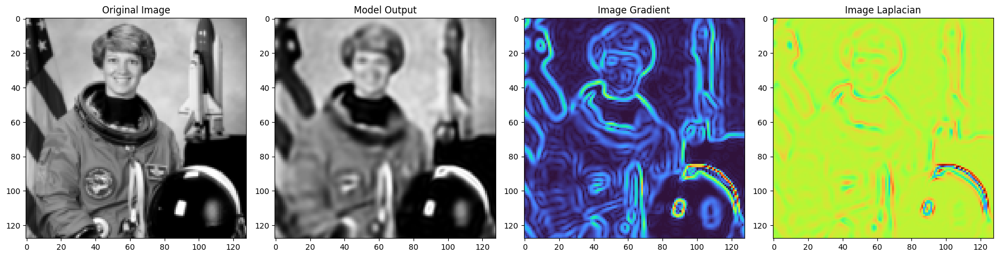

In [1]:
import matplotlib.pyplot as plt
import torch

from problem_1_train import train
from utils import ImageDataset

dataset = ImageDataset(height=128)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
siren_loss, siren_psnr = train(
    model="SIREN",
    dataset=dataset,
    lr=1e-4,
    total_steps=500,
    steps_til_summary=25,
    device=device,
    seed=42,
    **dict(
        in_features=2,
        out_features=1,
        hidden_features=128,
        hidden_layers=3,
    ),
)

Compare the loss and PSNR for the two models.

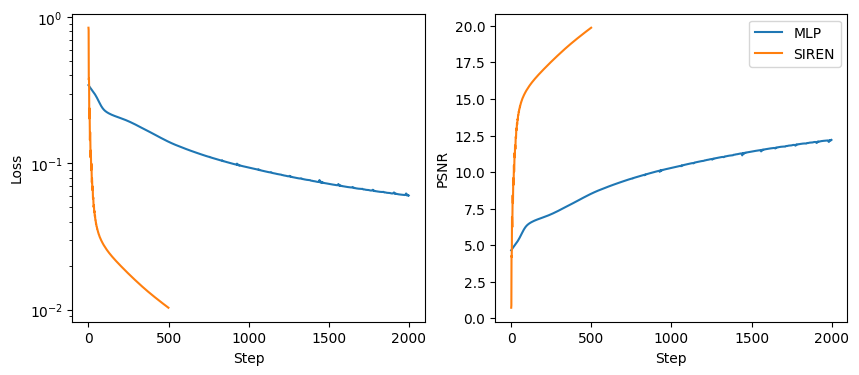

In [6]:
plt.figure(figsize=(10, 4))
plt.subplot(121)
plt.plot(mlp_loss, label="MLP")
plt.plot(siren_loss, label="SIREN")
plt.xlabel("Step")
plt.ylabel("Loss")
plt.yscale("log")
plt.subplot(122)
plt.plot(mlp_psnr, label="MLP")
plt.plot(siren_psnr, label="SIREN")
plt.xlabel("Step")
plt.ylabel("PSNR")
plt.legend()
plt.show()

# Experiement 2: Benchmarking

------------------------------------MLP(ReLU)_lr0.001_hl2_hf64------------------------------------
------------------------------------MLP(Tanh)_lr0.001_hl2_hf64------------------------------------
------------------------------------MLP(LeakyReLU)_lr0.001_hl2_hf64------------------------------------
------------------------------------SIREN(omega0-20.0-20.0)_lr0.001_hl2_hf64------------------------------------
------------------------------------SIREN(omega0-30.0-30.0)_lr0.001_hl2_hf64------------------------------------
------------------------------------GRID_lr0.001_hl2_hf64------------------------------------


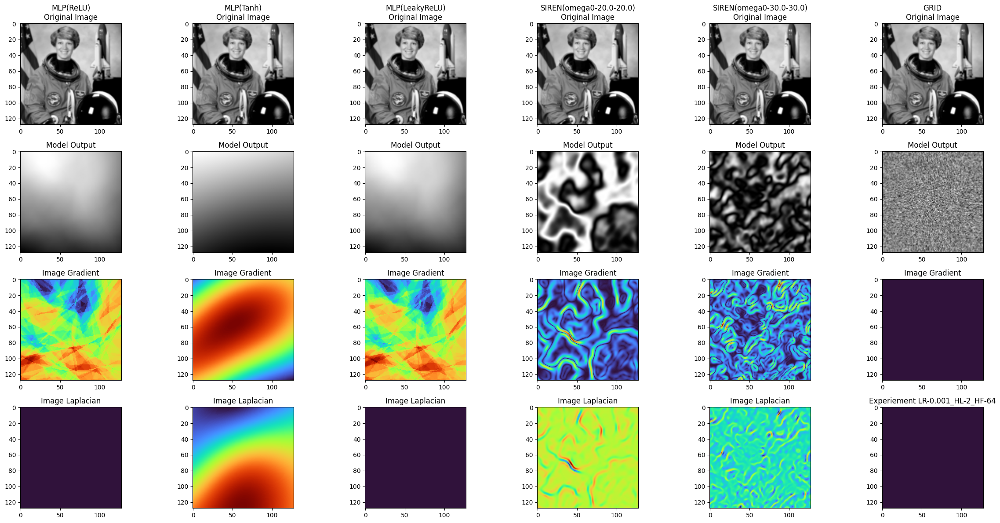

------------------------------------MLP(ReLU)_lr0.001_hl2_hf128------------------------------------
------------------------------------MLP(Tanh)_lr0.001_hl2_hf128------------------------------------
------------------------------------MLP(LeakyReLU)_lr0.001_hl2_hf128------------------------------------
------------------------------------SIREN(omega0-20.0-20.0)_lr0.001_hl2_hf128------------------------------------
------------------------------------SIREN(omega0-30.0-30.0)_lr0.001_hl2_hf128------------------------------------
------------------------------------GRID_lr0.001_hl2_hf128------------------------------------


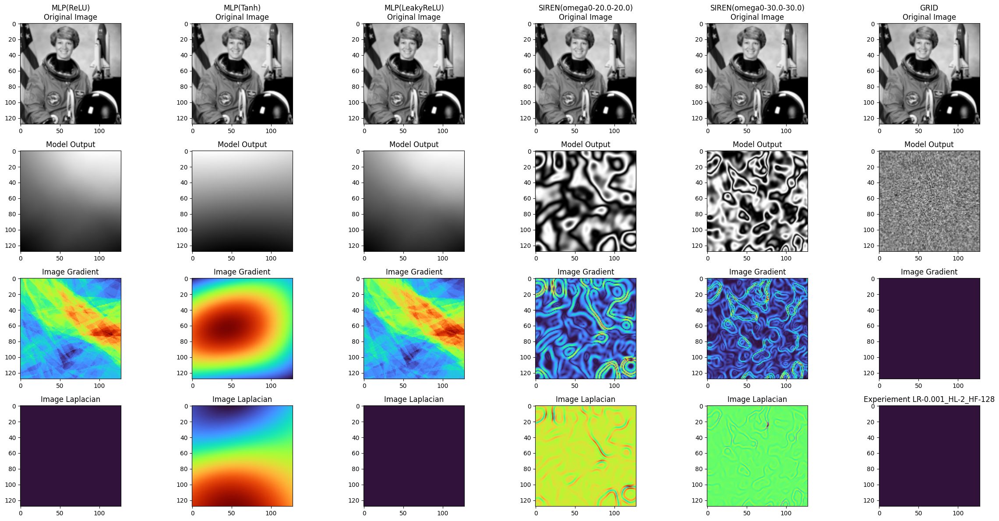

------------------------------------MLP(ReLU)_lr0.001_hl2_hf256------------------------------------
------------------------------------MLP(Tanh)_lr0.001_hl2_hf256------------------------------------
------------------------------------MLP(LeakyReLU)_lr0.001_hl2_hf256------------------------------------
------------------------------------SIREN(omega0-20.0-20.0)_lr0.001_hl2_hf256------------------------------------
------------------------------------SIREN(omega0-30.0-30.0)_lr0.001_hl2_hf256------------------------------------
------------------------------------GRID_lr0.001_hl2_hf256------------------------------------


KeyboardInterrupt: 

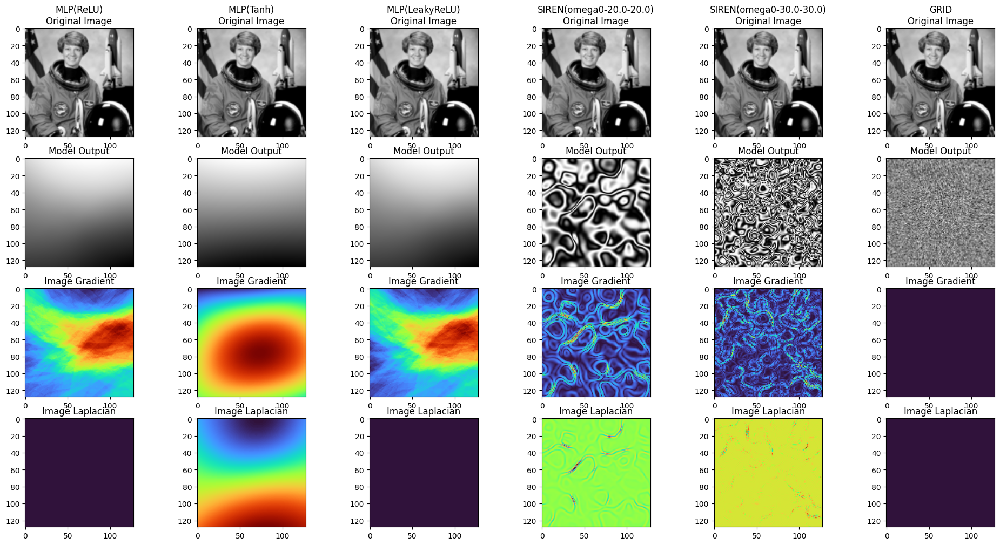

In [ ]:
import matplotlib.pyplot as plt
import torch
from itertools import product
from problem_1_train import train
from utils import ImageDataset

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Hyperparameters for grid search
learning_rates = [1e-3, 1e-4, 1e-5]
hidden_layers_list = [2, 3, 4]
hidden_features_list = [64, 128, 256]

# Models to compare
model_types = [
    {"model": "MLP", "activation": "ReLU"},
    {"model": "MLP", "activation": "Tanh"},
    {"model": "MLP", "activation": "LeakyReLU"},
    {"model": "SIREN", "first_omega_0": 20.0, "hidden_omega_0": 20.0},
    {"model": "SIREN", "first_omega_0": 30.0, "hidden_omega_0": 30.0},
    {"model": "GRID"}
]

# Benchmark results
benchmark_results = {}

# Grid Search over hyperparameters
for lr, hidden_layers, hidden_features in product(learning_rates, hidden_layers_list, hidden_features_list):
    experiment_name = f"LR-{lr}_HL-{hidden_layers}_HF-{hidden_features}"
    benchmark_results[experiment_name] = {}

    fig, axes = plt.subplots(nrows=4, ncols=len(model_types), figsize=(4 * len(model_types), 12))
    
    for col_idx, model_config in enumerate(model_types):
        # Prepare dataset
        dataset = ImageDataset(height=128)
        
        # Model parameters
        model_type = model_config["model"]
        if model_type == 'MLP':
            model_name = f"{model_type}({model_config['activation']})"
        elif model_type == 'SIREN':
            model_name = f"{model_type}(omega0-{model_config['first_omega_0']}-{model_config['hidden_omega_0']})"
        else:
            model_name = model_type
        full_experiment_name = f"{model_name}_lr{lr}_hl{hidden_layers}_hf{hidden_features}"
        print(f'Finish {full_experiment_name}')

        if model_type == "MLP":
            train_kwargs = {
                "activation": model_config["activation"],
                "hidden_layers": hidden_layers,
                "hidden_features": hidden_features,
                "in_features": 2,
                "out_features": 1
            }
        elif model_type == "SIREN":
            train_kwargs = {
                "first_omega_0": model_config["first_omega_0"],
                "hidden_omega_0": model_config["hidden_omega_0"],
                "hidden_layers": hidden_layers,
                "hidden_features": hidden_features,
                "in_features": 2,
                "out_features": 1
            }
        elif model_type == "GRID":
            train_kwargs = {"side_length": 128, "in_features": 2, "out_features": 1}

        # Train the model
        loss_history, psnr_history, model_output, img_grad, img_laplacian = train(
            model=model_type,
            dataset=dataset,
            lr=lr,
            total_steps=5,
            steps_til_summary=5,
            device=device,
            seed=42,
            plot_multi_models=True,
            **train_kwargs
        )

        # Store results
        benchmark_results[experiment_name][full_experiment_name] = {
            "loss": loss_history,
            "psnr": psnr_history
        }

        # Plot images for this model
        img = dataset.img.cpu().view(dataset.height, dataset.height)
        axes[0, col_idx].imshow(img, cmap="gray")
        axes[0, col_idx].set_title(f"{model_name}\nOriginal Image")
        
        axes[1, col_idx].imshow(model_output.cpu().detach().view(dataset.height, dataset.height), cmap="gray")
        axes[1, col_idx].set_title("Model Output")

        axes[2, col_idx].imshow(img_grad.norm(dim=-1).cpu().detach().view(dataset.height, dataset.height), cmap="turbo")
        axes[2, col_idx].set_title("Image Gradient")

        axes[3, col_idx].imshow(img_laplacian.cpu().detach().view(dataset.height, dataset.height), cmap="turbo")
        axes[3, col_idx].set_title("Image Laplacian")

    plt.tight_layout()
    fig.suptitle(f'Experiment {experiment_name}', fontsize=16)
    plt.savefig(f"benchmark_plots/{experiment_name}.png")
    plt.show()
    plt.close()


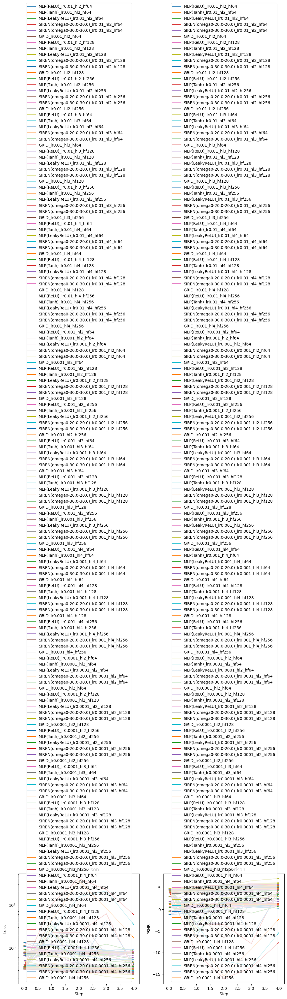

In [ ]:

# Generate separate plots for each hyperparameter experiment
for experiment_name, model_results in benchmark_results.items():
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

    # Plot Loss
    for key, result in model_results.items():
        axes[0].plot(result["loss"], label=key)
    axes[0].set_xlabel("Step")
    axes[0].set_ylabel("Loss")
    axes[0].set_yscale("log")
    axes[0].legend()
    axes[0].set_title(f"Loss Comparison - {experiment_name}")

    # Plot PSNR
    for key, result in model_results.items():
        axes[1].plot(result["psnr"], label=key)
    axes[1].set_xlabel("Step")
    axes[1].set_ylabel("PSNR")
    axes[1].legend()
    axes[1].set_title(f"PSNR Comparison - {experiment_name}")

    plt.tight_layout()
    plt.savefig(f"benchmark_curves_{experiment_name}.png")
    plt.close()
